In [1]:
%%html
<style>
.cartesianlayer .bars path,
.colorbar .cbfills,
.slider-rail-rect { clip-path: inset(0% 0% 0% 0% round 6px); }

.legendundefined { clip-path: inset(0% 0% 0% 0% round 3px); }

.gtitle .line:nth-of-type(2) { fill: grey; }

.output_area:last-of-type,
.cell_output {
    filter: drop-shadow(0px 0px 10px rgba(0, 0, 0, 0.2));
    -webkit-backdrop-filter: blur(0); // fixes a safari drop-shadow bug
}

#notebook-container img,
main img {
    box-shadow: 0px 0px 10px rgba(0, 0, 0, 0.2);
}

#notebook-container img,
main img,
.plotly-graph-div {
    border-radius: 10px;
    overflow: hidden;
    border: 1px solid #d8bea1;
}
</style>

# Predicting life expectancy

## Comparing education directly

As seen in the dataset, it's very common for countries with a good education to also have a high life expectancy. To make it more clear, the data can be visualized in this Bivariate Choropleth: Als een land een betere educatie heeft, dan heeft een land bijna altijd een hogere life-expectancy (bron: Bivariate Choropleth)

In this image, the left side of the legend is the education level, and the right side is the life expectancy. As shown, almost all countries with good education quality also have a high life expectancy. The reasoning behind this might be that people with better education tend to choose for a healthier way of life. It can also be visualized in the following way. This plot shows the rate in which people finish primary and secondary school, compared to the life expectancy of said person. This graph makes clear that people with better education tend to have a higher life expectancy. A reason for this increase in life expectancy comes from the fact that people with a better education make better choices. https://archpublichealth.biomedcentral.com/articles/10.1186/s13690-020-00402-5 

In [2]:
%run edu_vs_life_choropleth.ipynb

/tmp/ipykernel_93553/3606791772.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  border = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


# Second plot

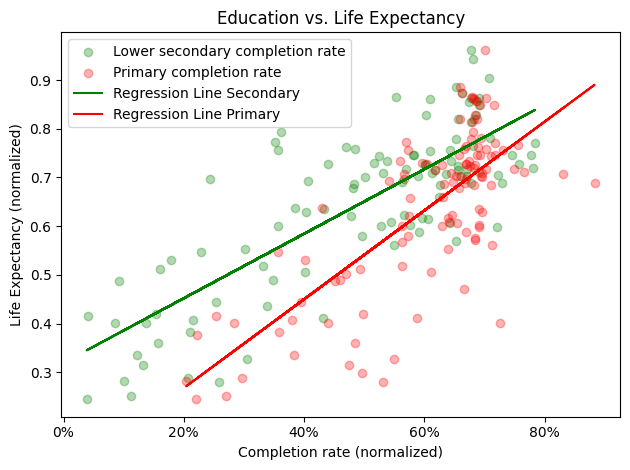

In [3]:
%run edu_vs_life_scatter.ipynb

## GDP Argument (Second argument)

We can also argue that a society with a good education will produce an increasing GDP. Research at the university of Munich has shown that people with a better education are able to achieve jobs with more complex skill sets, resulting in a higher paying job. If people in a society are able to keep higher paying jobs, the GDP from the country of origin will increase. This in turn will influence the life expectancy of a country. Research originating from the University of Zagreb has shown that an increase in GDP of a country, also has a positive influence on the country's life expectancy. This is confirmed when you convert the data into a Bivariate Chropleth or a scatter plot (with a regression). These charts show the GDP of a country and the country's life expectancy. This means that the increase in education gives an increase in GDP which delivers an increase in life expectancy. 


In [4]:
%run gdp_vs_life_bivar_choropleth.ipynb

/tmp/ipykernel_93553/4038919178.py:13: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



/tmp/ipykernel_93553/1407877280.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_93553/1407877280.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



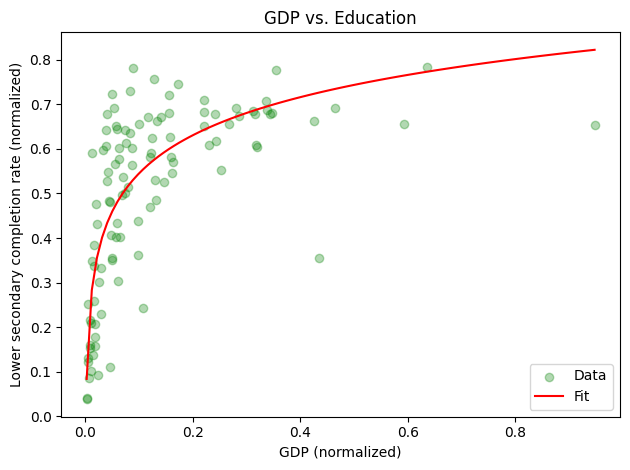

In [5]:
import numpy as np
import pandas as pd
import plotly.graph_objs as go
from scipy.optimize import curve_fit
from scipy.stats import zscore
import matplotlib.pyplot as plt

def log_func(x, a, b):
    return a * np.log(x) + b


# Calculate the z-scores of the data
second_df['z_score_GDP'] = zscore(second_df['GDP'])
second_df['z_score_Value'] = zscore(second_df['Value'])

# Define a threshold to identify outliers
threshold = 6

# Filter the data to remove outliers
filtered_df = second_df[(np.abs(second_df['z_score_GDP']) < threshold) & (np.abs(second_df['z_score_Value']) < threshold)]

# Extract cleaned data for fitting
x_cleaned = filtered_df["GDP"].values
y_cleaned = filtered_df["Value"].values

# Fit the data to the logarithmic function
popt, pcov = curve_fit(log_func, x_cleaned, y_cleaned)

# Generate x values for the fitted line
x_fit = np.linspace(min(x_cleaned), max(x_cleaned), 100)
y_fit = log_func(x_fit, *popt)

# Plot using Plotly
scatter = go.Scatter(x=filtered_df["GDP"], y=filtered_df["Value"], mode='markers', name='Data')
line = go.Scatter(x=x_fit, y=y_fit, mode='lines', name='Fit', line=dict(color='red'))

layout = go.Layout(title='GDP vs. Life Expectancy (Outliers Removed)',
                   xaxis=dict(title='GDP (normalized)'),
                   yaxis=dict(title='Completion rate (normalized)'))


# Optionally, you can use matplotlib to show the fit
plt.scatter(filtered_df['GDP'], filtered_df['Value'], alpha=0.3, c='green', label='Data')
plt.plot(x_fit, y_fit, color='red', label='Fit')
plt.xlabel('GDP (normalized)')
plt.ylabel('Lower secondary completion rate (normalized)')
plt.title('GDP vs. Education')
plt.legend()
plt.tight_layout()
plt.show()

# There are other factors that have more influence on life expectancy that should be prioritized. (CH2)

## The First Argument of Your Second Perspective

Even though A country investing in their education program results in an increase in life expectancy. There are more direct approaches to increasing a country's life expectancy. One possible solution is investing in increasing the country's vaccination rate. Diseases or viruses like Polio and Diphtheria can be fatal if not treated appropriately, in some cases (like for polio) there is no cure at all. Not treating these diseases results in a drastic decrease in life expectancy. So instead of investing in education to improve life expectancy, a country should invest in vaccines as this has a more direct effect. This can be seen in the plot where it shows an increase in vaccination rate for polio and Diphtheria corresponds with an increase in life expectancy. This is also found in the research by Jenifer Ehreth. Which concludes that improving the vaccination rate is a big factor in increasing a country's life expectancy.
https://www.sciencedirect.com/science/article/pii/S0264410X03003773 

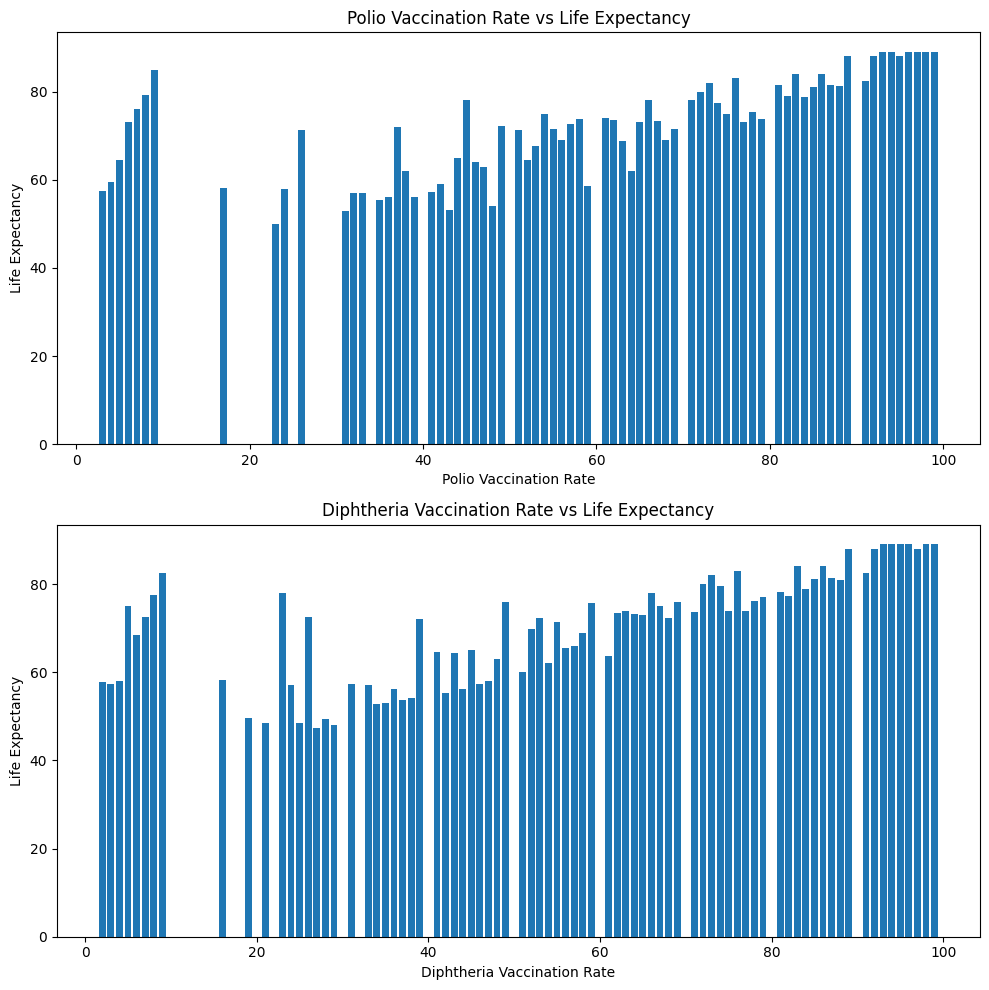

In [6]:
%run vaccination_bar_chart.ipynb

In [7]:
%run vaccination_bubble_plot.ipynb

## Conclusion

## References

https://www.kaggle.com/datasets/amirhosseinmirzaie/countries-life-expectancy

https://www.kaggle.com/datasets/nitishabharathi/gdp-per-capita-all-countries

https://data.worldbank.org/topic/education

https://archpublichealth.biomedcentral.com/articles/10.1186/s13690-020-00402-5

https://www.sciencedirect.com/science/article/pii/S0264410X03003773
